In [1]:
from scipy import signal
import numpy as np
from scipy.fftpack import fft, fftfreq, ifft
import matplotlib.pyplot as plt
import soundfile as sf
import IPython.display as ipd
import librosa.display
import librosa


/Users/erinlyamabe/Anaconda/anaconda3/envs/PythonGA/lib/python3.8/site-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


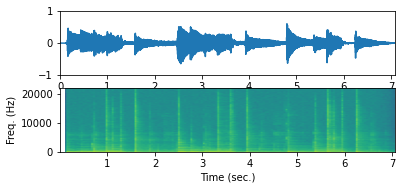

In [13]:
# AUDIOSPECGRAM
# This script displays a spectrogram of an audio signal using the
# Mat Plot Library.
#
# See also SPECTROGRAM


x, Fs = sf.read('AcGtr.wav')
N = len(x)
# Waveform
t = np.arange(0, N) / Fs
plt.subplot(311)
plt.plot(t,x)
plt.axis([0, N / Fs, -1, 1])

# Spectrogram
nfft = 2048 # Length of each time frame
window = np.hanning(nfft) # Calculated windowing function
overlap = 128 # Number of samples for frame overlap

plt.subplot(312)
spec, f, t, imAxis = plt.specgram(x,nfft, Fs, window=window, noverlap=overlap)
# f, t, Sxx = signal.spectrogram(x,fs=Fs, window=window, noverlap=overlap, nfft=nfft)
plt.axis('tight')
plt.axis('auto')
plt.xlabel('Time (sec.)')
plt.ylabel('Freq. (Hz)')
plt.show()

In [14]:
# VIBRATOEFFECT
# This function implements a vibrato effect based on depth and rate LFO
# parameters.
#
# Input variables
#   x: single sample of the input signal
#   buffer: used to store delayed samples of the signal
#   n: current sample number used for the LFO
#   depth: range of modulation (samples)
#   rate: speed of modulation (frequency, Hz)
#
# See also CHORUSEFFECT

def vibratoEffect(x, buffer, Fs, n, depth, rate):
    # Calculate lfo for current sample
    t = n/Fs
    lfo = (depth/2) * np.sin(2 * np.pi * rate * t) + depth

    # Determine indexes for circular buffer
    N = len(buffer)
    indexC = np.mod(n, N) # Current index in circular buffer

    fracDelay = np.mod(n-lfo, N) # Delay index in circular buffer
    intDelay = int(np.floor(fracDelay)) # Fractional delay indices
    frac = fracDelay - intDelay

    nextSamp = np.mod(intDelay, N) - 1 # Next index in circular buffer

    out = (1-frac) * buffer[intDelay-1] + frac * buffer[nextSamp]

    # Store the current output in appropriate index
    buffer[indexC] = x

    return out, buffer

In [15]:
# VIBRATOEXAMPLE
# This script creates a vibrato effect, applied to an acoustic guitar
# recording. Parameters for the effect include 'rate' and 'depth,' which can
# be used to control the intensity of the vibrato. At the end of the script,
# the sound of the result is played.
#
# See also VIBRATOEFFECT

x, Fs = sf.read('AcGtr.wav') # Input signal
Ts = 1/Fs
N = len(x)

# Initialize the delay buffer
maxDelay = 1000 # Samples
buffer = np.zeros([maxDelay])

# LFO parameters
t = np.arange(0, N) * Ts
rate = 4 # Frequency of LFO in Hz
depth = 75 # Range of samples of delay

# Initialize output signal
out = np.zeros([N])

for n in range(N):
    out[n], buffer = vibratoEffect(x[n], buffer, Fs, n, depth, rate)
    if n == 70:
        out[n], buffer = vibratoEffect(x[n], buffer, Fs, n, depth, rate)

ipd.Audio(out, rate=Fs)


In [16]:
# CHORUSEFFECT
# This function can be used to create a chorus audio effect.
#
# Input variables
#   x: single sample of the input signal
#   buffer: used to store delayed samples of the signal
#   n: current sample number used for the LFO
#   depth: range of modulation (milliseconds)
#   rate: speed of modulation (frequency, Hz)
#   predelay: offset of modulation (milliseconds)
#   wet: percent of processed signal (dry = 100 - wet)
#
# See also VIBRATOEFFECT, FLANGEREFFECT

def chorusEffect(x, buffer, Fs, n, depth, rate, predelay, wet):
    # Calculate time in seconds for current sample
    t = n/Fs
    lfoMS = depth * np.sin(2 * np.pi * rate * t) + predelay
    lfoSamples = (lfoMS/1000) * Fs

    # Wet/dry mix
    mixPercent = wet # 0 = only dry, 100 = only wet
    mix = mixPercent/100

    fracDelay = lfoSamples
    intDelay = int(np.floor(fracDelay))
    frac = fracDelay - intDelay

    # Store dry and wet signals
    drySig = x
    wetSig = (1-frac) * buffer[intDelay-1] + frac * buffer[intDelay]

    # Blend parallel paths
    out = (1-mix) * drySig + mix * wetSig

    # Linear buffer implemented
    buffer = np.append(x, buffer[0:-1])
    # buffer[1:] = buffer[0:-1]
    # buffer[0] = x

    return out, buffer

In [17]:
# CHORUSEXAMPLE
# This script creates a chorus effect, applied to an acoustic guitar
# recording. Parameters for the effect include 'rate' and 'depth,' which can
# be used to control the intensity of the vibrato. At the end of the script,
# the sound of the result is played.
#
# See also CHORUSEFFECT

x, Fs = sf.read('AcGtr.wav')
Ts = 1/Fs

maxDelay = int(np.ceil(0.05*Fs)) # Maximum delay of 50 ms
buffer = np.zeros(maxDelay)

rate = 0.6 # Hz (frequency of LFO)
depth = 5 # Milliseconds (amplitude of LFO)
predelay = 30 # Milliseconds (offset of LFO)

wet = 50 # Percent wet (dry = 100 - wet)

# Initialize output signal
N = len(x)
out = np.zeros(N)

for n in range(N):
    # Use chorusEffect function
    out[n], buffer = chorusEffect(x[n], buffer, Fs, n, depth, rate, predelay, wet)

ipd.Audio(out, rate=Fs)

In [18]:
# FLANGEREFFECT
# This function can be used to create a flanger audio effect.
#
# Input variables
#   x: single sample of the input signal
#   buffer: used to store delayed samples of the signal
#   n: current sample number used for the LFO
#   depth: range of modulation (samples)
#   rate: speed of modulation (frequency, Hz)
#   predelay: offset of modulation (samples)
#   wet: percent of processed signal (dry = 100 - wet)
#
# See also CHORUSEFFECT, FEEDBACKFLANGER, BARBERPOLEFLANGER

def flangerEffect(x, buffer, Fs, n, depth, rate, predelay, wet):
    # Calculate time in seconds
    t = n/Fs
    lfo = depth * np.sin(2 * np.pi * rate * t) + predelay

    # Wet/dry mix
    mixPercent = wet # 0 = only dry, 100 = only wet
    mix = mixPercent/100

    fracDelay = lfo
    intDelay = int(np.floor(fracDelay))
    frac = fracDelay - intDelay

    # Store dry and wet signals
    drySig = x
    wetSig = (1-frac) * buffer[intDelay-1] + frac * buffer[intDelay]

    # Blend parallel paths
    out = (1-mix)*drySig + mix*wetSig

    # Update buffer
    buffer = np.append(x, buffer[0:-1])
    # buffer[1:] = buffer[0:-1]
    # buffer[0] = x

    return out, buffer

In [19]:
# FEEDBACKFLANGER
# This function can be used to create a feedback flanger.
#
# Input variables
#   x: single sample of the input signal
#   buffer: used to store delayed samples of the signal
#   n: current sample number used for the LFO
#   depth: range of modulation (samples)
#   rate: speed of modulation (frequency, Hz)
#   predelay: offset of modulation (samples)
#   wet: percent of processed signal (dry = 100 - wet)
#
# See also FLANGEREFFECT

def feedbackFlanger(x, buffer, Fs, n, depth, rate, predelay, wet):
    # Calculate time in seconds
    t = n/Fs
    lfo = depth * np.sin(2 * np.pi * rate * t) + predelay

    # Wet/dry mix
    mixPercent = wet # 0 = only dry, 100 = only wet
    mix = mixPercent/100

    fracDelay = lfo
    intDelay = int(np.floor(fracDelay))
    frac = fracDelay - intDelay

    # Store dry and wet signals
    drySig = x
    wetSig = (1-frac) * buffer[intDelay-1] + frac * buffer[intDelay]

    # Blend parallel paths
    out = (1-mix)*drySig + mix*wetSig

    # Feedback is created by storing the output in the buffer
    # instead of the input.
    buffer = np.append(x, buffer[0:-1])
    # buffer[1:] = buffer[0:-1]
    # buffer[0] = out

    return out, buffer

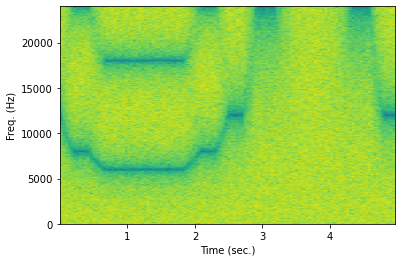

In [20]:
# FLANGEREXAMPLE
# This script creates a flanger effect, applied to white noise. Within the
# processing loop, a feedback flanger can be substituted for the feedforward
# flanger used by default.
#
# See also FLANGEREFFECT

Fs = 48000
Ts = 1/Fs
sec = 5
lenSamples = sec*Fs
x = 0.2 * np.random.randn(lenSamples) # White noise input

# Create delay buffer to hold maximum possible delay samples
maxDelay = 50 + 1
buffer = np.zeros(maxDelay)

rate = 0.2 # Hz (frequency of LFO)
depth = 4 # Samples (amplitude of LFO)
predelay = 5 # Samples (offset of LFO)
wet = 50 # Wet/dry mix

# Initialize output signal
N = len(x)
out = np.zeros(N)

for n in range(N):
    # Use flangerEffect function
    out[n], buffer = flangerEffect(x[n], buffer, Fs, n, depth, rate, predelay, wet)

    # Use feedbackFlanger function
    out[n], buffer = feedbackFlanger(x[n], buffer, Fs, n, depth, rate, predelay, wet)

# Spectrogram
nfft = 2048
window = np.hanning(nfft) # or signal.windows.hann(nfft)
overlap = 128
spec, f, t, imAxis = plt.specgram(out, nfft, Fs, window=window, noverlap=overlap)
plt.axis('tight')
plt.axis('auto')
plt.xlabel('Time (sec.)')
plt.ylabel('Freq. (Hz)')
plt.show()

ipd.Audio(out, rate=Fs)

In [21]:
# BARBERPOLEFLANGER
# This function can be used to create a barber-pole flanger.
#
# Input variables
#   x: single sample of the input signal
#   buffer: used to store delayed samples of the signal
#   n: current sample number used for the LFO
#   depth: range of modulation (samples)
#   rate: speed of modulation (frequency, Hz)
#   predelay: offset of modulation (samples)
#   wet: percent of processed signal (dry = 100 - wet)
#
# See also FLANGEREFFECT, FEEDBACKFLANGER, BARBERPOLEFLANGER2

def barberpoleFlanger(x, buffer, Fs, n, depth, rate, predelay, wet):
    # Calculate time in seconds for the current sample
    t = n/Fs
    lfo = depth * signal.sawtooth(2 * np.pi * rate * t, 0) + predelay

    # Wet/dry mix
    mixPercent = wet
    mix = mixPercent/100

    fracDelay = lfo
    intDelay = int(np.floor(fracDelay))
    frac = fracDelay - intDelay

    # Store dry and wet signals
    drySig = x
    wetSig = (1-frac) * buffer[intDelay-1] + frac * buffer[intDelay]

    # Blend parallel paths
    out = (1-mix)*drySig + mix*wetSig

    buffer = np.append(x, buffer[0:-1])
    # buffer[1:] = buffer[0:-1]
    # buffer[0] = x

    return out, buffer, lfo

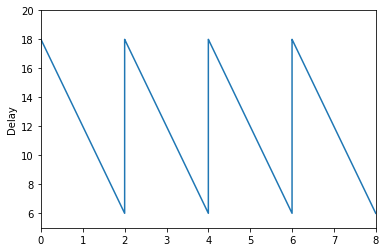

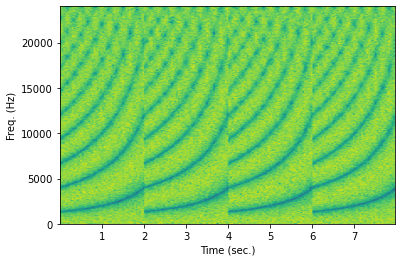

In [22]:
# BARBERPOLEEXAMPLE
# This script creates a barber-pole flanger effect using a single delay buffer.
# The delay time is modulated byt a sawtooth LFO. There is audible distortion
# each time the LFO starts a new cycle.
#
# This script produces a plot with a delay time of the LFO and the spectrogram
# of white noise processed by the effect
#
# See also BARBERPOLE2EXAMPLE

Fs = 48000
Ts = 1/Fs
sec = 8
lenSamples = sec*Fs
x = 0.2 * np.random.randn(lenSamples)
t = np.arange(0, lenSamples) * Ts

# Create delay buffer to hold maximum possible delay time
maxDelay = 50 + 1
buffer = np.zeros(maxDelay)

rate = 0.5 # Hz (frequency of LFO)
depth = 6 # samples (amplitude of LFO)
predelay = 12 # samples (offset of LFO)

# Wet/dry mix
wet = 50 # 0 = only dry, 100 = only wet

# Initialize output signal
N = len(x)
out = np.zeros(N)
lfo = np.zeros(N)

for n in range(N):
    # Use barberpoleFlanger function
    out[n], buffer, lfo[n] = barberpoleFlanger(x[n], buffer, Fs, n, depth, rate, predelay, wet)

# Waveform
plt.plot(t,lfo)
plt.axis([0, len(t)*Ts, 5, 20])
plt.ylabel('Delay')
plt.show()

# Spectrogram
nfft = 2048 # Length of each time frame
window = np.hanning(nfft) # Calculated windowing function
overlap = 128 # Number of samples for frame overlap
spec, f, t, imAxis = plt.specgram(out, nfft, Fs, window=window, noverlap=overlap)
plt.axis('tight')
plt.axis('auto')
plt.xlabel('Time (sec.)')
plt.ylabel('Freq. (Hz)')
plt.show()

ipd.Audio(out, rate=Fs)

In [7]:
# BARBERPOLEFLANGER2
# This function can be used to create a barber-pole flanger. Specifically,
# the function is meant to crossfade between two flangers so that the rising
# flanger has a smooth transition at the start of each sawtooth ramp.
#
# Input variables
#   x: single sample of the input signal
#   buffer: used to store delayed samples of the signal
#   n: current sample number used for the LFO
#   depth: range of modulation (samples)
#   rate: speed of modulation (frequency, Hz)
#   predelay: offset of modulation (samples)
#   wet: percent of processed signal (dry = 100 - wet)
#   g1: amplitude of the first flanger in the crossfade
#   g2: amplitude of the second flanger in the crossfade
#
# See also BARBERPOLEFLANGER

def barberpoleFlanger2(x, buffer, Fs, n, depth, rate, predelay, wet, g1, g2):
    # Calculate time in seconds for the current sample
    t = n/Fs
    # Rate/2 because alternating, overlapping LFOs
    lfo1 = depth * signal.sawtooth(2 * np.pi * rate/2 * t + np.pi/6, 0)
    # Hard-clipping at a negative value creates overlap
    if lfo1 < -1:
        lfo1 = -1

    lfo1 = lfo1 + predelay - 2
    lfo2 = depth * signal.sawtooth(2 * np.pi * rate/2 * t + 7*np.pi/6, 0)
    if lfo2 < -1:
        lfo2 = -1

    lfo2 = lfo2 + predelay - 2

    # Wet/dry mix
    mixPercent = wet # 0 = only dry, 100 = only wet
    mix = mixPercent/100

    fracDelay1 = lfo1
    intDelay1 = int(np.floor(fracDelay1))
    frac1 = fracDelay1 - intDelay1

    fracDelay2 = lfo2
    intDelay2 = int(np.floor(fracDelay2))
    frac2 = fracDelay2 - intDelay2

    # Store dry and wet signals
    drySig = x
    wetSig = g1 * ((1-frac1) * buffer[intDelay1-1] + frac1 * buffer[intDelay1]) + g2 * ((1-frac2) * buffer[intDelay2-1] + frac2 * buffer[intDelay2])

    # Blend parallel paths
    out = (1-mix)*drySig + mix*wetSig

    buffer = np.append(x, buffer[0:-1])
    # buffer[1:] = buffer[0:-1]
    # buffer[0] = x

    return out, buffer, lfo1, lfo2

In [20]:
# CROSSFADES
# This function is used for modulated delay effects which require a crossfade
# between two different delays. The function returns the amplitude values for
# two different paths assuming a sawtooth LFO.
#
# Input variables
#   Fs: sampling rate
#   len: total length in samples for a1 and a2
#   Hz: number of fades per second
#   fade: duration of overlap in samples

def crossfades(Fs, length, Hz, fade):
    period = Fs/Hz
    win = signal.windows.hann(fade*2)

    n = 0
    g1 = np.zeros(length)
    g2 = np.zeros(length)
    while n < length:
        # Position of 'n' relative to a cycle
        t = n % period
        if t < period/2 - fade:  #fade/2
            g1[n] = 1
            g2[n] = 0
            c = 0
        elif t < period/2: #+ fade/2 # first fade
            g1[n] = pow(win[fade+c], 0.5)
            g2[n] = pow(win[c], 0.5)
            c = c + 1
        elif t < period - fade:
            g1[n] = 0
            g2[n] = 1
            c = 0
        else: # 2nd fade
            g1[n] = pow(win[c], 0.5)
            g2[n] = pow(win[fade+c], 0.5)
            c = c + 1

        n = n + 1

    return g1, g2

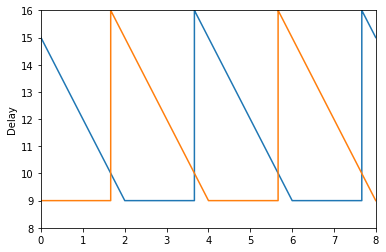

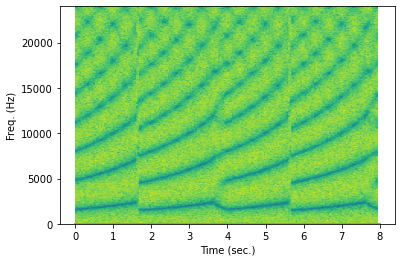

In [9]:
# BARBERPOLE2EXAMPLE
# This script creates a barber-pole flanger effect using two delay buffers,
# which gradually fades back and forth between the buffers to have a smooth
# transition at the start of the sawtooth ramp.
#
# See also BARBERPOLEEXAMPLE

Fs = 48000
Ts = 1/Fs
sec = 8
lenSamples = sec*Fs
x = 0.2 * np.random.randn(lenSamples)
t = np.arange(0, lenSamples) * Ts

# Create a delay buffer to hold maximum delay time
maxDelay = 50 + 1
buffer = np.zeros(maxDelay)

rate = 0.5 # Hz (frequency of LFO)
depth = 6 # samples (amplitude of LFO)
predelay = 12 # samples (offset of LFO)

# Wet/dry mix
wet = 50 # 0 = only dry, 100 = only wet

# Initialize output signal
N = len(x)
out = np.zeros(N)
lfo1 = np.zeros(N)
lfo2 = np.zeros(N)
overlap = 18000 # Number of samples of overlap per crossfade
g1, g2 = crossfades(Fs, lenSamples, rate/2, overlap)

for n in range(N):
    out[n], buffer, lfo1[n], lfo2[n] = barberpoleFlanger2(x[n], buffer, Fs, n, depth, rate, predelay, wet, g1[n], g2[n])

# Waveform
plt.plot(t, lfo1, t, lfo2)
plt.axis([0, len(t)*Ts, 8, 16])
plt.ylabel('Delay')
plt.show()

plt.plot(t, g1, t, g2) # Crossfade gains
plt.ylabel('Amplitude')

# Spectrogram
nfft = 2048 # Length of each time frame
window = np.hanning(nfft) # Calculated windowing function
overlap = 128 # Number of samples for frame overlap
spec, f, t, imAxis = plt.specgram(out, nfft, Fs, window=window, noverlap=overlap)
plt.axis('tight')
plt.axis('auto')
plt.xlabel('Time (sec.)')
plt.ylabel('Freq. (Hz)')
plt.show()

ipd.Audio(out, rate=Fs)

[Text(0.5, 1.0, 'Mel-frequency spectrogram')]

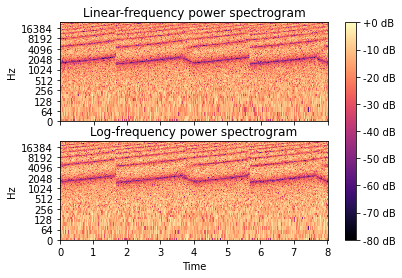

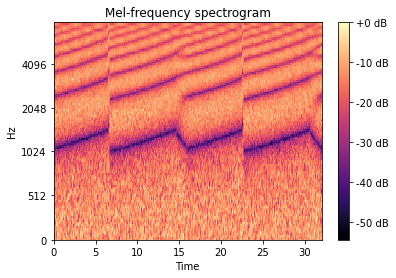

In [10]:
fig, ax = plt.subplots(nrows=2, ncols=1, sharey=True)
D = librosa.amplitude_to_db(np.abs(librosa.stft(out)), ref=np.max)
img = librosa.display.specshow(D, y_axis='linear', x_axis='time',
                               sr=Fs, ax=ax[0])
ax[0].set(title='Linear-frequency power spectrogram')
ax[0].label_outer()

hop_length = 1024
D = librosa.amplitude_to_db(np.abs(librosa.stft(out, hop_length=hop_length)),
                            ref=np.max)
librosa.display.specshow(D, y_axis='log', sr=Fs, hop_length=hop_length,
                         x_axis='time', ax=ax[1])
ax[1].set(title='Log-frequency power spectrogram')
ax[1].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")

# Mel-spectrogram
mspec = librosa.feature.melspectrogram(out, sr=Fs, n_fft=nfft, window='hann', hop_length=overlap)
fig, ax = plt.subplots()
mspec_dB = librosa.power_to_db(mspec, ref=np.max)
img = librosa.display.specshow(mspec_dB, x_axis='time',
                               y_axis='mel', sr=Fs,
                               fmax=8000, ax=ax)
fig.colorbar(img, ax=ax, format='%+2.0f dB')
ax.set(title='Mel-frequency spectrogram')

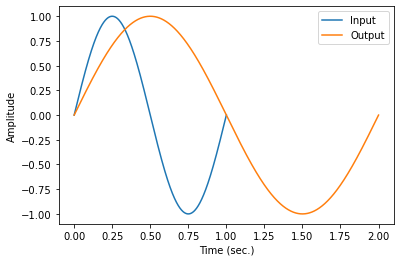

In [3]:
# BASICPITCHDOWN
# This script demonstrates a basic example of pitch shifting down an octave
# created by using a modulated time delay.
#
# See also BASICPITCHUP, BASICPITCH

# Synthesize 1 Hz test signal
Fs = 48000
Ts = 1/Fs
t = np.arange(0, Fs) * Ts
f = 1
x = np.sin(2 * np.pi * f * t)
x = np.append(x, np.zeros(Fs))

# Initialize loop for pitch decrease
d = 0   # Initially start with no delay
N = len(x)
y = np.zeros(N)
buffer = np.zeros(Fs*2)

for n in range(N):
    intDelay = int(np.floor(d))
    frac = d - intDelay
    if intDelay == 0:   # When there are 0 samples of delay
                        # 'y' is based on input 'x'
        y[n] = (1-frac) * x[n] + frac * buffer[0]
    else:   # Greater than 0 samples of delay
            # Interpolate between delayed samples "in the past"
        y[n] = (1-frac) * buffer[intDelay-1] + frac * buffer[intDelay]

    # Store the current input in delay buffer
    buffer = np.append(x[n], buffer[0:-1])
    # buffer[1:] = buffer[0:-1]
    # buffer[0] = x[n]

    # Increase the delay time by 0.5 samples
    d = d + 0.5

plt.plot(t,x[0:48000])
time = np.arange(0,len(y)) * Ts
plt.plot(time,y)
plt.xlabel('Time (sec.)')
plt.ylabel('Amplitude')
plt.legend(['Input', 'Output'])
plt.show()

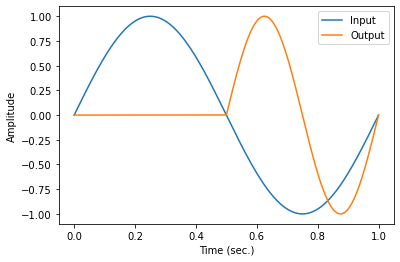

In [4]:
# BASICPITCHUP
# This script demonstrates a basic example of pitch shifting up an octave
# created by using a modulated time delay.
#
# See also BASICPITCHDOWN, BASICPITCH

# Synthesize 1 Hz signal
Fs = 48000
Ts = 1/Fs
t = np.arange(0, Fs) * Ts
f = 1
x = np.sin(2 * np.pi * f * t)

d = Fs                  # Initial delay time

N = len(x)              # Number of samples
y = np.zeros(N)         # Initialize output signal
buffer = np.zeros(Fs+1) # Delay buffer

for n in range(N):
    intDelay = int(np.floor(d))
    frac = d - intDelay
    if intDelay == 0:
        y[n] = (1-frac) * x[n] + frac * buffer[0]
    else:
        y[n] = (1-frac) * buffer[intDelay-1] + frac * buffer[intDelay]

    # Store current input in delay buffer
    buffer = np.append(x[n], buffer[0:-1])
    # buffer[1:] = buffer[0:-1]
    # buffer[0] = x[n]

    # Decrease the delay time by 1 sample
    d = d - 1

plt.plot(t,x)
plt.plot(t,y)
plt.xlabel('Time (sec.)')
plt.ylabel('Amplitude')
plt.legend(['Input', 'Output'])
plt.show()

In [5]:
# PLOTTF
# Plot sampled signal in time and frequency domains. Plots the time-domain
# samples in vector x, assuming that Fs is an audio sampling rate
# (44.1k, 48k, etc.) in samples/second, and also plots the Fourier transform
# on the decibel scale between the frequencies of 20 Hz and 20 kHz,
# logarithmically spaced.
#
# See also PLOT

def plottf(x, Fs):

    Ts = 1/Fs
    N = len(x)
    t = np.arange(0, N) * 1/Fs

    plt.subplot(2, 1, 1)
    plt.plot(t, x)
    plt.xlabel('Time (sec.)')
    plt.ylabel('Amplitude')

    # Fourier Transform
    length = N
    if length < 4096:
        length = 4096

    X = (2/N) * fft(x, n=length) # do DFT/FFT
    f = np.arange(0, length) * (Fs / length)

    X[abs(X) < 0.000001] = 0.000001

    plt.subplot(2, 1, 2)
    plt.semilogx(f, 20 * np.log10(abs(X)))
    plt.axis([20, 20000, -60, 4])
    plt.xticks([20, 50, 100, 200, 300, 500, 1000, 2000, 5000, 10000, 20000], [20, 50, 100, 200, 300, 500, 1000, 2000, 5000, 10000, 20000])
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Amplitude (dB)')
    plt.show()

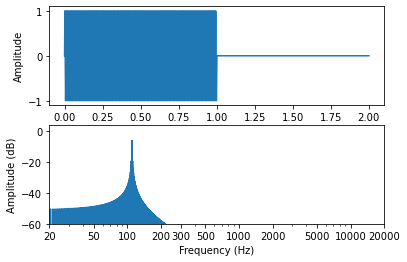

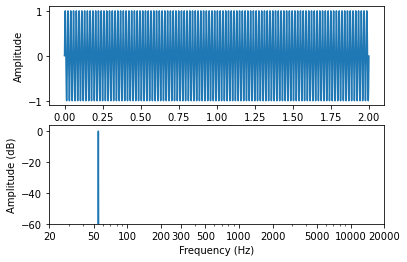

In [11]:
# BASICPITCH
# This script demonstrates a basic example of pitch shifting created by using
# a modulated time delay.

Fs = 48000
Ts = 1/Fs
t = np.arange(0, Fs) * Ts
f = 110 # Musical note A2 = 110 Hz
x = np.sin(2 * np.pi * f * t)

# Pitch shift amount
semitones = -12
tr = pow(2, (semitones/12))
dRate = 1 - tr # Delay rate of change

# Conditional to handle pitch up or pitch down
if dRate > 0: # Pitch decrease
    d = 0
    x = np.pad(x, (0, Fs), 'constant') # Prepare for signal to be elongated

else: # Pitch increase
    # Initialize delay so it is always positive
    d = len(x) * -dRate

N = len(x)
y = np.zeros(N)
buffer = np.zeros(Fs*2)
M = len(buffer) - 1
wIndex = (Fs * 2) - 1

for n in range(N):
    intDelay = int(np.floor(d)) # round down to get previous sample
    frac = d - intDelay # find fractional amount

    rIndex = wIndex - intDelay  # set location of read index

    # Ensure read index is not exceeding the length of the buffer
    if rIndex < 0:
        rIndex += M

    # Ensure read index does not go out of bounds of the buffer
    if rIndex == 0:
        y[n] = (1-frac) * buffer[rIndex] + frac * buffer[M]
    else:
        y[n] = (1-frac) * buffer[rIndex] + frac * buffer[rIndex - 1]

    # Store the current output in circular buffer
    buffer[wIndex] = x[n]
    wIndex += 1
    if wIndex > M:
        wIndex = 1

    d += dRate

plottf(x, Fs)
plt.figure()
plottf(y, Fs)

# plt.plot(t, y[:Fs])
# plt.xlabel('Time (sec.)')
# plt.ylabel('Amplitude')
# plt.figure()
#
# Y = np.fft.fft(y)
# Yfreq = np.fft.fftfreq(y.size, d = 1/Fs)
# Yabs = (2/len(Y)) * np.abs(Y)  # Normalization
#
# plt.plot(Yfreq[:500], 20* np.log10(Yabs[:500]))
# plt.xlabel('Frequency (Hz)')
# plt.ylabel('Amplitude (dB)')
# plt.show()

/Users/erinlyamabe/Anaconda/anaconda3/envs/PythonGA/lib/python3.8/site-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


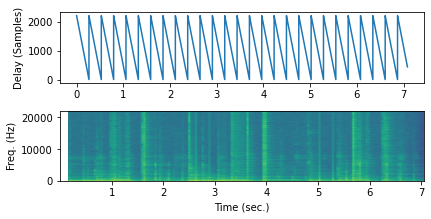

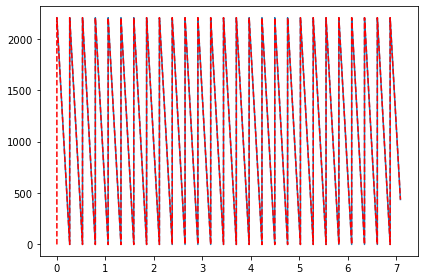

In [7]:
# LFOPITCH
# This script demonstrates an example of pitch shifting using a sawtooth LFO
# to modulate delay time. The result is a signal that has been pitch shifted
# based on the 'semitones' variable.
#
# An important aspect of this algorithm is to avoid having the processed
# signal to be a different length than the original signal. To make this
# possible, the maximum delay time is 50 ms. A sawtooth LFO is used to
# modulate the delay time between 0ms and 50ms based on the necessary rate
# of change. If the delay time is about to go outside of this range, a new
# cycle of the sawtooth begins.
#
# The output signal has audible clicks and pops due to the discontinuities
# of the modulated delay. This motivates the use of two parallel delay lines
# that crossfade back and forth to smooth over the discontinuities.
#
# See also BASICPITCH, PITCHSHIFTER, PITCHSHIFTEREXAMPLE

# Synthesize 1 Hz test signal
x, Fs = sf.read('AcGtr.wav')
Ts = 1/Fs

semitones = 3
tr = pow(2, semitones/12)
dRate = 1 - tr          # Delay rate of change

maxDelay = int(Fs * 0.05)    # Maximum delay is 50ms

# Conditional to handle pitch up and pitch down
if dRate > 0:   # Pitch decrease
    d = 0

else:           # Pitch increase
    # Initialize delay so it is always positive
    d = maxDelay

N = len(x)
out = np.zeros(N)
lfo = np.zeros(N)
buffer = np.zeros(maxDelay)

for n in range(N):
    # Determine output of delay buffer
    # which could be a fractional delay time
    intDelay = int(np.floor(d)) - 1
    frac = d - intDelay

    if intDelay == 0:   # When delay time = zero
                        # 'out' comes 'in', not just delay buffer
        out[n] = (1-frac) * x[n] + frac * buffer[0]

    else:
        out[n] = (1-frac) * buffer[intDelay-1] + frac * buffer[intDelay]

    # Store the current output in appropriate index
    buffer = np.append(x[n], buffer[0:-1])

    # Store the current delay in signal for plotting
    lfo[n] = d
    d = d + dRate # Change the delay time for the next loop

    # If necessary, start a new cycle in LFO
    if d < 0:
        d = maxDelay
    elif d > maxDelay:
        d = 0

t = np.arange(0, N) * Ts

plt.subplot(3, 1, 1)
plt.plot(t, lfo) # Crossfade gains
plt.ylabel('Delay (Samples)')
plt.tight_layout()

# Spectrogram
plt.subplot(3,1,2)
nfft = 2048 # length of each time frame
window = signal.windows.hann(nfft) # calculated windowing function
overlap = 128 # number of samples for frame overlap
spec, f, tSpec, imAxis = plt.specgram(out, nfft, Fs, window=window, noverlap=overlap)
plt.axis('tight')
plt.axis('auto')
plt.xlabel('Time (sec.)')
plt.ylabel('Freq. (Hz)')
plt.show()

plt.figure()
tau = (maxDelay/dRate) * Ts
f = 1/tau
plt.plot(t, lfo, t, maxDelay * (0.5 * signal.sawtooth(2 * np.pi * f * t)+ 0.5), 'r--')
plt.tight_layout()
plt.show()

ipd.Audio(out, rate=Fs)

In [8]:
def fractionalDelay(Fs, fracDelay):
        M = 192000
        buffer = np.zeros(M)
        wIndex = M

        N = len(x)
        out = np.zeros(N)

        for n in range(N):
            intDelay = int(np.floor(fracDelay))
            frac = fracDelay - intDelay

            rIndex = wIndex - intDelay

            if rIndex < 0:
                rIndex += M

            if rIndex == 0:
                y[n] = (1-frac) * buffer[rIndex] + frac * buffer[M]
            else:
                y[n] = (1-frac) * buffer[rIndex] + frac * buffer[rIndex - 1]

            buffer[wIndex] = x
            wIndex += 1

            if wIndex > M:
                wIndex = 0

        return out

In [16]:
# FIX THIS SCRIPT!!! - Audio output

# PITCHSHIFTER
# This function implements the pitch shifter audio effect by using two parallel
# delay lines. The delay time for each line is modulated by a sawtooth LFO. The
# frequency of the LFO is based on the desired number of semitones for the
# pitch shifter. Both increases and decreases in pitch are possible with this
# function.
#
# Both LFOs repeat a cycle such that the delay time stays within a range of 0ms
# to 50ms. This way the processed signal is not significantly shorter or longer
# than the original signal.
#
# The cycles of the two LFOs are intentionally offset to have an overlap. An
# amplitude crossfade is applied to the delay lines to switch between the two
# during the overlap. The crossfade reduces the audibility of the relatively
# large discontinuity in the delay time at the start of the LFO cycle.
#
# See also PITCHSHIFTEREXAMPLE, CROSSFADES, LFOPITCH

def pitchShifter(x, Fs, semitones):
    Ts = 1 / Fs
    N = len(x)  # Total number of samples
    out = np.zeros(N)
    y1 = np.zeros(N)
    y2 = np.zeros(N)
    lfo1 = np.zeros(N)  # for visualizing LFOs
    lfo2 = np.zeros(N)

    maxDelay = int(Fs * .05)  # Maximum delay is 50ms
    buffer1 = np.zeros(maxDelay + 1)
    buffer2 = np.zeros(maxDelay + 1)
    wIndex1 = maxDelay
    wIndex2 = maxDelay

    tr = pow(2, semitones / 12)  # Convert semitones
    dRate = 1 - tr  # Delay rate of change

    tau = (maxDelay / abs(dRate)) * Ts  # Period of sawtooth LFO
    freq = 1 / tau  # Frequency of LFO

    fade = round((tau * Fs) / 8)  # Fade length is 1/8 of a cycle
    Hz = (freq / 2) * (8 / 7)  # Frequency crossfade due to overlap
    g1, g2 = crossfades(Fs, N, Hz, fade)  # Crossfade gains

    if dRate > 0:  # Pitch decrease
        # Initialize delay so LFO cycles line up with crossfade
        d1 = dRate * fade
        d2 = maxDelay
        d1Temp = d1  # These variables are used to control the length of
        d2Temp = d2  # each cycle of the LFO for the proper amount of overlap

    else:  # Pitch increase
        # Initialize delay so LFO cycles line up with crossfade
        d1 = maxDelay - (maxDelay / 8)
        d2 = 0
        d1Temp = d1
        d2Temp = d2

    # Loop to process input signal
    for n in range(N):
        # Parallel delay processing of the input signal
        intDelay1 = int(np.floor(d1))  # round down to get previous sample
        intDelay2 = int(np.floor(d2))

        frac1 = d1 - intDelay1  # find fractional amount
        frac2 = d2 - intDelay2

        rIndex1 = wIndex1 - intDelay1  # set location of read index
        rIndex2 = wIndex2 - intDelay2

        # Ensure read index is not exceeding the length of the buffer
        if rIndex1 < 0:
            rIndex1 += maxDelay

        if rIndex2 < 0:
            rIndex2 += maxDelay

        # Ensure read index does not go out of bounds of the buffer
        if rIndex1 == 0:
            y1 = (1 - frac1) * buffer1[rIndex1] + frac1 * buffer1[maxDelay]
        else:
            y1 = (1 - frac1) * buffer1[rIndex1] + frac1 * buffer1[rIndex1 - 1]

        if rIndex2 == 0:
            y2 = (1 - frac2) * buffer2[rIndex2] + frac2 * buffer2[maxDelay]
        else:
            y2 = (1 - frac2) * buffer2[rIndex2] + frac2 * buffer2[rIndex2 - 1]

        # Store the current output in circular buffer
        buffer1[wIndex1] = x[n]
        buffer2[wIndex2] = x[n]

        wIndex1 += 1
        if wIndex1 > maxDelay:
            wIndex1 = 1

        wIndex2 += 1
        if wIndex2 > maxDelay:
            wIndex2 = 1

        # Use crossfade gains to combine the output of each delay
        out[n] = g1[n] * y1 + g2[n] * y2

        lfo1[n] = d1  # Save the current delay times for plotting
        lfo2[n] = d2

        # The following conditions are set up to control the
        # overlap of the sawtooth LFOs
        if dRate < 0:  # Slope of LFO is negative (pitch up)
            d1 += dRate
            d1Temp += dRate
            if d1 < 0:
                d1 = 0  # Portion of LFO where delay time = 0

            if d1Temp < -maxDelay * (6 / 8):  # Start next cycle
                d1 = maxDelay
                d1Temp = maxDelay

            d2 += dRate
            d2Temp += dRate
            if d2 < 0:
                d2 = 0  # Portion of LFO where delay time = 0

            if d2Temp < -maxDelay * (6 / 8):  # Start next cycle
                d2 = maxDelay
                d2Temp = maxDelay

        else:  # Slope of LFO is positive (pitch down)
            d1Temp += dRate
            if d1Temp > maxDelay:  # Start next cycle
                d1 = 0
                d1Temp = -maxDelay * (6 / 8)

            elif d1Temp < 0:
                d1 = 0  # Portion where delay time = 0

            else:
                d1 += dRate

            d2Temp += dRate
            if d2Temp > maxDelay:  # Start next cycle
                d2 = 0
                d2Temp = -maxDelay * (6 / 8)

            elif d2Temp < 0:
                d2 = 0  # Portion where delay time = 0

            else:
                d2 += dRate

    # Plotting
    t = np.arange(0, N) * Ts
    plt.subplot(4, 1, 1)  # Waveform
    plt.plot(t, lfo1, t, lfo2)
    plt.axis([0, t[-1], -100, maxDelay])
    plt.ylabel('Delay')

    plt.subplot(4, 1, 2)
    plt.plot(t, g1, t, g2)  # Crossfade gains
    plt.axis([0, t[-1], -0.1, 1.1])
    plt.ylabel('Amplitude')

    plt.figure()
    nfft = 2048  # Length of each time frame
    window = signal.windows.hann(nfft)  # Calculated window function
    overlap = 128  # Number of samples for frame overlap
    spec, f, tSpec, imAxis = plt.specgram(out)
    plt.show()

    return out

/Users/erinlyamabe/Anaconda/anaconda3/envs/PythonGA/lib/python3.8/site-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


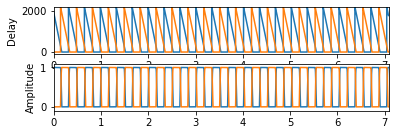

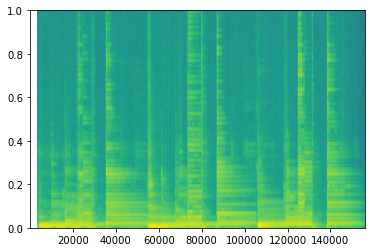

In [26]:
# FIX THIS SCRIPT!!!! - GLITCHING

# PITCHSHIFTEREXAMPLE
# This script is an example to demonstrate the pitchShifter function
# for processing an audio signal. The desired number of semitones
# can be set from within this script.

# Import acoustic guitar recording for processing
x, Fs = sf.read('AcGtr.wav')

# Experiment with different values
semitones = 4

out = pitchShifter(x, Fs, semitones=semitones)

ipd.Audio(out, rate=Fs)

/Users/erinlyamabe/Anaconda/anaconda3/envs/PythonGA/lib/python3.8/site-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


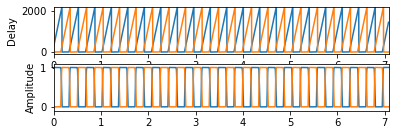

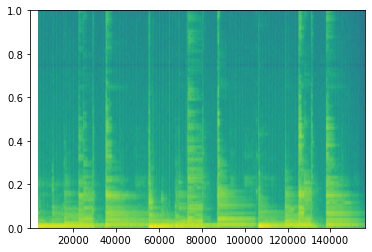

In [24]:
# FIX PITCHSHIFTER SCRIPT!!! DOES NOT SOUND CORRECT/GLITCHING!

# HARMONYEXAMPLE
# This script creates a harmony effect by blending together a pitch shifted
# signal with the original, unprocessed signal.
#
# See also PITCHSHIFTER, PITCHSHIFTEREXAMPLE

# Import acoustic guitar recording for processing
x, Fs = sf.read('AcGtr.wav')

# Pitch shifted down a perfect fourth
semitones = -5
processed = pitchShifter(x, Fs, semitones=semitones)

# Blend together input and processed
out = 0.5 * (x + processed)

ipd.Audio(out, rate=Fs)

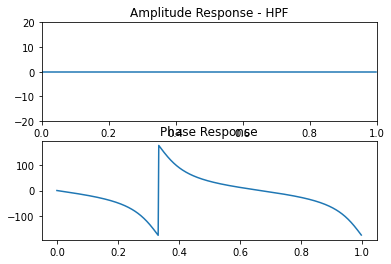

In [2]:
# FIX FREQZ!!!

# ALLPASSFILTER
# This script demonstrates an implementation of an all-pass filter using a
# delay buffer (Direct Form II).

x = np.append(1, np.zeros(100))

buffer = np.zeros(5) # Longer buffer than delay length

# Number of samples of delay
delay = 2 # Does not need to be the same length as buffer

g = 0.5

N = len(x)
out = np.zeros(N)

for n in range(N):
    # Series all-pass filters
    out[n] = g * x[n] + buffer[delay]
    buffer = np.append(x[n] + -g * out[n], buffer[0:-1])

[W, H] = signal.freqz(out)

Hamp = abs(H)
Hphase = np.angle(H)

plt.subplot(2,1,1)
plt.plot(W/np.pi, 20*np.log10(Hamp))
plt.axis([0,1,-20, 20])
plt.title('Amplitude Response - HPF')
plt.subplot(2,1,2)
plt.plot(W/np.pi, Hphase*(180/np.pi))
plt.title('Phase Response')
plt.show()

In [14]:
# PHASEREFFECT
# This function can be used to create a phaser audio effect.
#
# Input Variables:
#   x: single sample of the input signal
#   buffer: used to store delayed samples of the signal
#   n: current sample number used for LFO
#   depth: range of modulation (samples)
#   rate: speed of modulation (frequency, Hz)
#   wet: percent of processed signal (dry = 100 - wet)
#
# See also BIQUADPHASER

def phaserEffect(x, buffer, Fs, n, depth, rate, wet):
    # Calculate time in seconds for the current sample
    t = n/Fs
    lfo = depth * np.sin(2 * np.pi * rate * t) + 2

    # Wet/dry mix
    mixPercent = wet
    mix = mixPercent/100

    fracDelay = lfo
    intDelay = int(np.floor(fracDelay))
    frac = fracDelay - intDelay

    # Store dry and wet signals
    drySig = x

    g = 0.25
    # All-pass filter
    wetSig = g * x + ((1-frac) * buffer[intDelay-1] + frac * buffer[intDelay])

    # Signal parallel paths
    out = (1-mix) * drySig + mix * wetSig

    buffer = np.append(x, buffer[0:-1])
    
    return out, buffer

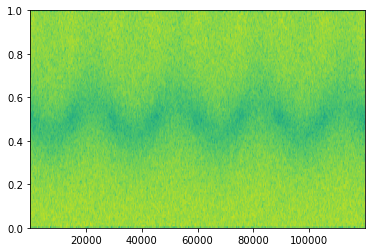

In [10]:
# PHASEREXAMPLE
# This script demonstrates the use of a phaser function to add the effect to
# white noise. Parameters of the phaser effect include the rate and depth of
# the LFO. In this implementation, the delay time of an APF (Direct Form II)
# is modulated.
#
# See also PHASEREFFECT

Fs = 48000
Ts = 1/Fs
sec = 5
lenSamples = sec * Fs
x = 0.2 * np.random.randn(lenSamples)

N = len(x)

rate = 0.8 # Hz (frequency of LFO)
depth = 0.3 # samples (amplitude of LFO)

# Initialize delay buffers
buffer = np.zeros(3) # All-pass filter

# Wet/dry mix
wet = 50

# Initialize output signal
out = np.zeros(len(x))

for n in range(N):
    # Use phaser effect function
    out[n], buffer = phaserEffect(x[n], buffer, Fs, n, depth, rate, wet)

nfft = 2048  # Length of each time frame
window = signal.windows.hann(nfft)  # Calculated window function
overlap = 128  # Number of samples for frame overlap
spec, f, tSpec, imAxis = plt.specgram(out)
plt.show()

ipd.Audio(out, rate=Fs)

In [16]:
# BIQUADPHASER
# This function can be used to create a phaser audio effect by using a bi-quad
# APF.
#
# Input Variables
#   x: single sample of the input signal
#   Fs: sampling rate
#   lfo: used to determine the frequency of APF
#   ff: buffer for feedforward delay
#   fb: buffer for feedback delay
#   wet: percent of processed signal (dry = 100 - wet)
#
# Use Table 13.1 to calculate APF bi-quad coefficients.
#
# See also PHASEREFFECT, BIQUADWAH

def biquadPhaser(x, Fs, lfo, Q, ff, fb, wet):
    # Convert value of LFO to normalized frequency
    w0 = 2 * np.pi * lfo / Fs
    # Normalize bandwidth
    alpha = np.sin(w0)/ (2 * Q)

    b0 = 1 - alpha
    b1 = -2 * np.cos(w0)
    b2 = 1 + alpha
    a0 = 1 + alpha
    a1 = -2 * np.cos(w0)
    a2 = 1 - alpha

    # Wet/dry mix
    mixPercent = wet # 0 - only dry, 100 - only wet
    mix = mixPercent/100

    drySig = x

    # All-pass filter
    wetSig = (b0/a0) * x + (b1/a0) * ff[0] + (b2/a0) * ff[1] - (a1/a0) * fb[0] - (a2/a0) * fb[1]

    # Blend parallel paths
    out = (1 - mix) * drySig + mix * wetSig

    # Iterate buffers for next sample
    ff[1] = ff[0]
    ff[0] = x
    fb[1] = fb[0]
    fb[0] = wetSig

    return out, ff, fb

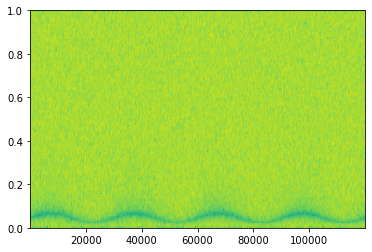

In [18]:
# PHASEREXAMPLE2
# This script implements a phaser effect using a bi-quad filter as the APF.
#
# See also BIQUADPHASER

Fs = 48000
Ts = 1/Fs
sec = 5
x = 0.2 * np.random.randn(sec * Fs)
N = len(x)

rate = 0.8 # Hz (frequency of LFO)
centerFreq = 1000 # Hz (center freq. of LFO)
depth = 500 # Hz (LFO range = 500 to 1500)

# Feedforward delay buffer
ff = np.zeros(2) # ff[n] = n samples of delay
# Feedback delay buffer
fb = np.zeros(2)# fb[n] = n samples of delay

# Bandwidth of phaser (wide or narrow notch)
Q = 0.5

# Wet/dry mix
wet = 50

# Initialize output signal
out = np.zeros(N)

for n in range(N):
    t = n * Ts
    lfo = depth * np.sin(2 * np.pi * rate * t) + centerFreq

    # Use bi-quad phaser effect function
    out[n], ff, fb = biquadPhaser(x[n], Fs, lfo, Q, ff, fb, wet)

nfft = 2048
window = signal.windows.hann(nfft)
overlap = 128
spec, f, tSpec, imAxis = plt.specgram(out)

ipd.Audio(out, rate=Fs)

In [19]:
# BIQUADWAH
# This function can be used to create a wah-wah audio effect.
#
# Input Variables
#   x: single sample of the input signal
#   Fs: sampling rate
#   lfo: used to determine the frequency of LPF
#   ff: buffer for feedforward delay
#   fb: buffer for feedback delay
#   wet: percent of processed signal (dry = 100 - wet)
#
# Use Table 13.1 to calculate LPF bi-quad coefficients.
#
# See also BIQUADPHASER

def biquadWah(x, Fs, lfo, Q, ff, fb, wet):
    # Convert value of LFO to normalized frequency
    w0 = 2 * np.pi * lfo / Fs
    # Normalize bandwidth
    alpha = np.sin(w0)/ (2 * Q)

    b0 = (1 - np.cos(w0)) / 2
    b1 = 1 -  np.cos(w0)
    b2 = (1 - np.cos(w0)) / 2
    a0 = 1 + alpha
    a1 = -2 * np.cos(w0)
    a2 = 1 - alpha

    # Wet/dry mix
    mixPercent = wet # 0 - only dry, 100 - only wet
    mix = mixPercent/100

    drySig = x

    # All-pass filter
    wetSig = (b0/a0) * x + (b1/a0) * ff[0] + (b2/a0) * ff[1] - (a1/a0) * fb[0] - (a2/a0) * fb[1]

    # Blend parallel paths
    out = (1 - mix) * drySig + mix * wetSig

    # Iterate buffers for next sample
    ff[1] = ff[0]
    ff[0] = x
    fb[1] = fb[0]
    fb[0] = wetSig

    return out, ff, fb

/Users/erinlyamabe/Anaconda/anaconda3/envs/PythonGA/lib/python3.8/site-packages/matplotlib/axes/_axes.py:7723: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


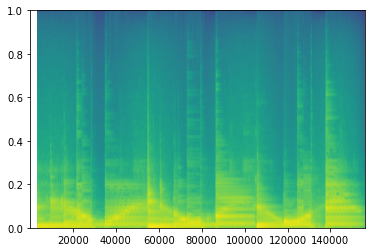

In [23]:
# AUTOWAHEXAMPLE
# This script implements an auto-wah effect using a bi-quad filter as the
# resonant LPF.
#
# See also BIQUADWAH

x, Fs = sf.read('AcGtr.wav')
Ts = 1/Fs

N = len(x)

rate = 0.5 # Hz (frequency of LFO)
centerFreq = 1500 # Hz (center freq. of LFO)
depth = 1000 # Hz (LFO range = 500 to 1500)

# Feedforward delay buffer
ff = np.zeros(2) # ff[n] = n samples of delay
# Feedback delay buffer
fb = np.zeros(2)# fb[n] = n samples of delay

# Bandwidth of resonant LPF
Q = 7

# Wet/dry mix
wet = 100

# Initialize output signal
out = np.zeros(N)

for n in range(N):
    t = n * Ts
    lfo = depth * np.sin(2 * np.pi * rate * t) + centerFreq

    # Use bi-quad wah effect function
    out[n], ff, fb = biquadWah(x[n], Fs, lfo, Q, ff, fb, wet)

nfft = 2048
window = signal.windows.hann(nfft)
overlap = 128
spec, f, tSpec, imAxis = plt.specgram(out)

ipd.Audio(out, rate=Fs)
